based on https://jhat.readthedocs.io/en/latest/examples/plot_b_nircam.html


# JWST NIRCAM

Aligning JWST/NIRCAM images with JHAT.


An example NIRCam Dataset is downloaded, and then a series of
alignment methods are used. For more information on the
key parameters used for alignment see 
`params:Useful Parameters`.

In [46]:
import sys,os,glob
import pandas as pd
from astropy.io import fits
from astropy.table import Table
from astropy.nddata import extract_array
from astropy.coordinates import SkyCoord
from astropy import wcs
from astropy.wcs.utils import skycoord_to_pixel
from astropy import units as u
from astropy.stats import sigma_clipped_stats
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from astroquery.mast import Observations
from astropy.visualization import (simple_norm,LinearStretch)
from astroquery.gaia import Gaia
from jwst.datamodels import ImageModel

from scipy.ndimage import binary_dilation
from copy import deepcopy

import jhat
from jhat import jwst_photclass,st_wcs_align

from nbutils import xmatch_common

## Relative Alignment

**Create a Photometric Catalog for Relative Alignment**

We choose one of the images to be the reference image, and then 
create a catalog that we will use to align the other image.



In [44]:
ref_image = glob.glob('jwstred_temp_dolphot/jhat/jw01334001001_02101_00001_nrcalong_cal.fits')[0]

In [45]:
jwst_phot = jwst_photclass()
jwst_phot.run_phot(imagename=ref_image,photfilename='auto',overwrite=True,ee_radius=80,use_dq=True)
ref_catname = ref_image.replace('.fits','.phot.txt') # the default
refcat = Table.read(ref_catname,format='ascii')
print(refcat)

0 jwstred_temp_dolphot/jhat/jw01334001001_02101_00001_nrcalong_cal.phot.txt
Using DQ extension!!


2024-10-23 21:25:07,558 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2024-10-23 21:25:07,633 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2024-10-23 21:25:07,638 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2024-10-23 21:25:07,638 - stpipe - INFO - Instrument: NIRCAM
2024-10-23 21:25:07,639 - stpipe - INFO - Detector: NRCALONG
2024-10-23 21:25:07,639 - stpipe - INFO - Filter: F277W
2024-10-23 21:25:07,639 - stpipe - INFO - Pupil: CLEAR
2024-10-23 21:25:07,639 - stpipe - INFO - Subarray: FULL
2024-10-23 21:25:07,649 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)


dmag 0.36200000000000004
aper_sum_3.1px annulus_median_3.1px aper_bkg_3.1px ...   x_idl      y_idl   
-------------- -------------------- -------------- ... ---------- ----------
      17.05291             0.125203       3.745917 ... -64.498349  -64.02691
     24.044717             0.142995       4.278209 ... -52.616507  -64.19261
     22.031191             0.139599         4.1766 ... -49.359387  -64.22841
     38.052771             0.212293       6.351518 ... -44.460286 -64.286125
    251.214048             0.437952      13.102912 ...  -19.99565 -64.427825
     23.642064             0.195762       5.856925 ... -13.046352 -64.513827
    211.410436             0.443764      13.276818 ...  -6.766352 -64.576989
     18.988386             0.275759       8.250335 ...  -6.432456 -64.531055
    444.992225             0.632639      18.927682 ...   2.459461 -64.568671
     70.385814             0.253196       7.575281 ...  11.938346 -64.684457
           ...                  ...            ... 

**Align the second image**

The plots outputted here show the various steps used by jhat to
determine the true matching sources in the image, and the
subsequent correction needed for optimal alignment.



In [63]:
# align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrca4_cal.fits')[0]
align_image = glob.glob('jwstred_temp_gaia/jw01334001001_04101_00001_nrca4_cal.fits')[0]

0 ./jwstred_temp_dolphot/jhat/jw01334001001_02101_00004_nrcalong.phot.txt
Using DQ extension!!


2024-10-23 21:31:17,532 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2024-10-23 21:31:17,604 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2024-10-23 21:31:17,610 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2024-10-23 21:31:17,610 - stpipe - INFO - Instrument: NIRCAM
2024-10-23 21:31:17,610 - stpipe - INFO - Detector: NRCALONG
2024-10-23 21:31:17,611 - stpipe - INFO - Filter: F277W
2024-10-23 21:31:17,611 - stpipe - INFO - Pupil: CLEAR
2024-10-23 21:31:17,611 - stpipe - INFO - Subarray: FULL
2024-10-23 21:31:17,622 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)


dmag 0.2172
dmag 0.1
sharpness 0.9
roundness1 0.7
mag 21
x 2008
y 2008
Saving refcat file into ./jwstred_temp_dolphot/jhat/jw01334001001_02101_00004_nrcalong.refcat.txt
reffile_d2d 0.2
*** Note: close plot to continue!


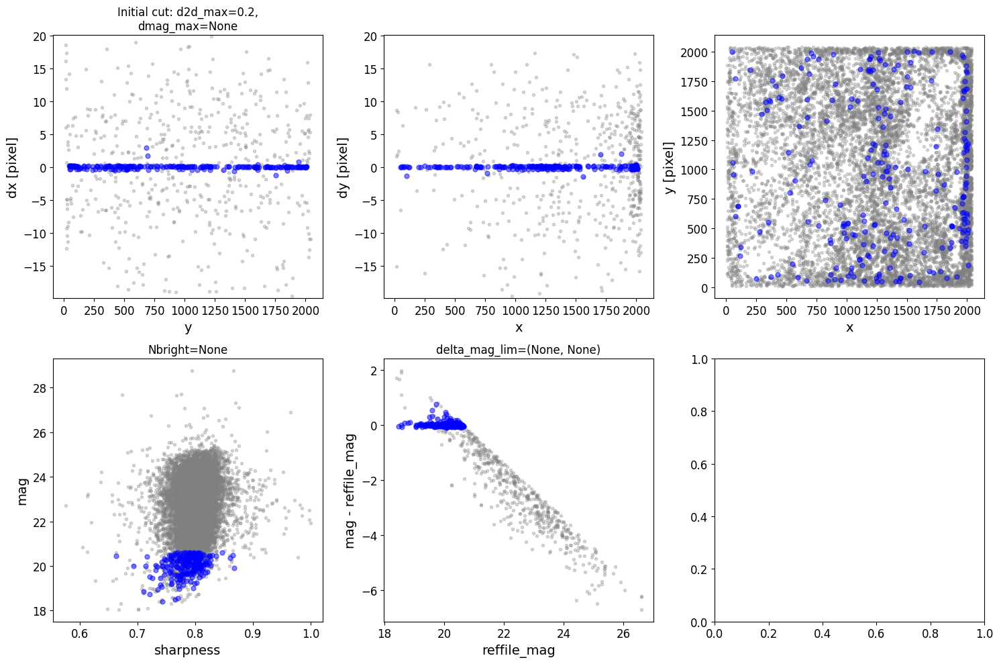

   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.000049      -0.05   228.0      2    -0.072643   1.6     False
d_rot_tmp 0.7273574966115877
Keeping 232 out of 232, skippin 0 because of null values in columns d_rot_tmp
median: 0.075353
75.000000 percentile cut: max residual for cut: 0.149988
__tmp_residuals 0.14998835814030506
median: 0.082870
i:00 mean:0.082870(0.005733) stdev:0.075409(0.004042) X2norm:1.00 Nchanged:0 Ngood:174 Nclip:58

mean: 0.095095
i:01 mean:0.095095(0.006415) stdev:0.088192(0.004524) X2norm:1.00 Nchanged:16 Ngood:190 Nclip:42

mean: 0.094960
i:02 mean:0.094960(0.006782) stdev:0.094224(0.004783) X2norm:1.00 Nchanged:4 Ngood:194 Nclip:38

mean: 0.093564
i:03 mean:0.093564(0.006891) stdev:0.095980(0.004860) X2norm:1.00 Nchanged:1 Ngood:195 Nclip:37

mean: 0.093564
i:04 mean:0.093564(0.006891) stdev:0.095980(0.004860) X2norm:1.00 Nchanged:0 Ngood:195 Nclip:37


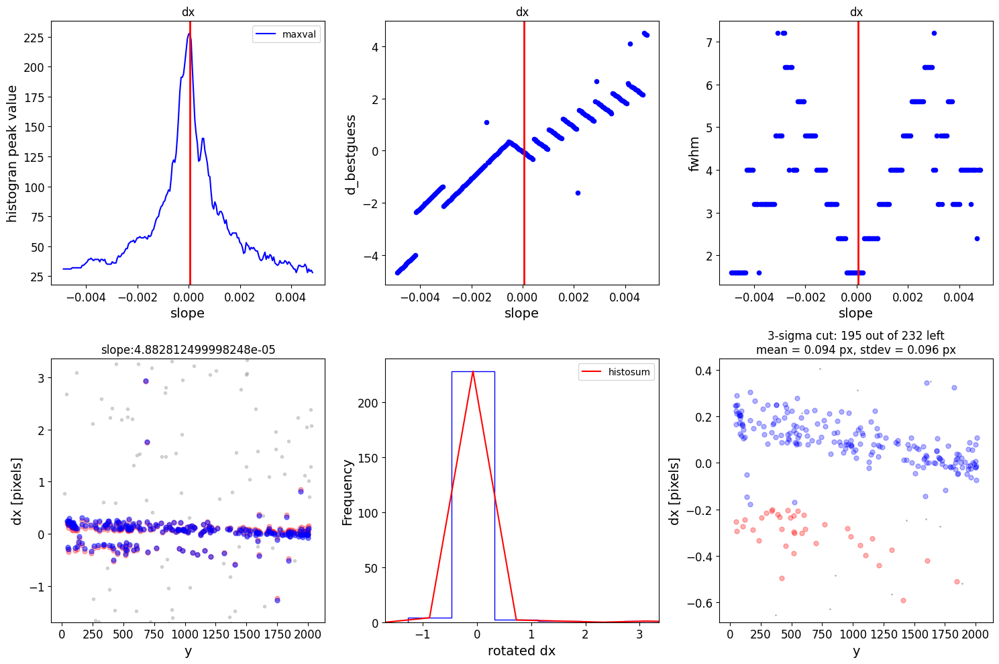

    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000098        0.1   165.0      2    -0.225695   1.6     False
d_rot_tmp 0.5743047723297412
Keeping 194 out of 194, skippin 0 because of null values in columns d_rot_tmp
median: 0.051798
75.000000 percentile cut: max residual for cut: 0.208266
__tmp_residuals 0.2082664539604582
median: 0.080943
i:00 mean:0.080943(0.007859) stdev:0.094305(0.005538) X2norm:1.00 Nchanged:0 Ngood:145 Nclip:49

mean: 0.065840
i:01 mean:0.065840(0.009534) stdev:0.122090(0.006721) X2norm:1.00 Nchanged:20 Ngood:165 Nclip:29

mean: 0.035008
i:02 mean:0.035008(0.011058) stdev:0.149183(0.007798) X2norm:1.00 Nchanged:18 Ngood:183 Nclip:11

mean: 0.013586
i:03 mean:0.013586(0.012193) stdev:0.169385(0.008599) X2norm:1.00 Nchanged:11 Ngood:194 Nclip:0

mean: 0.013586
i:04 mean:0.013586(0.012193) stdev:0.169385(0.008599) X2norm:1.00 Nchanged:0 Ngood:194 Nclip:0


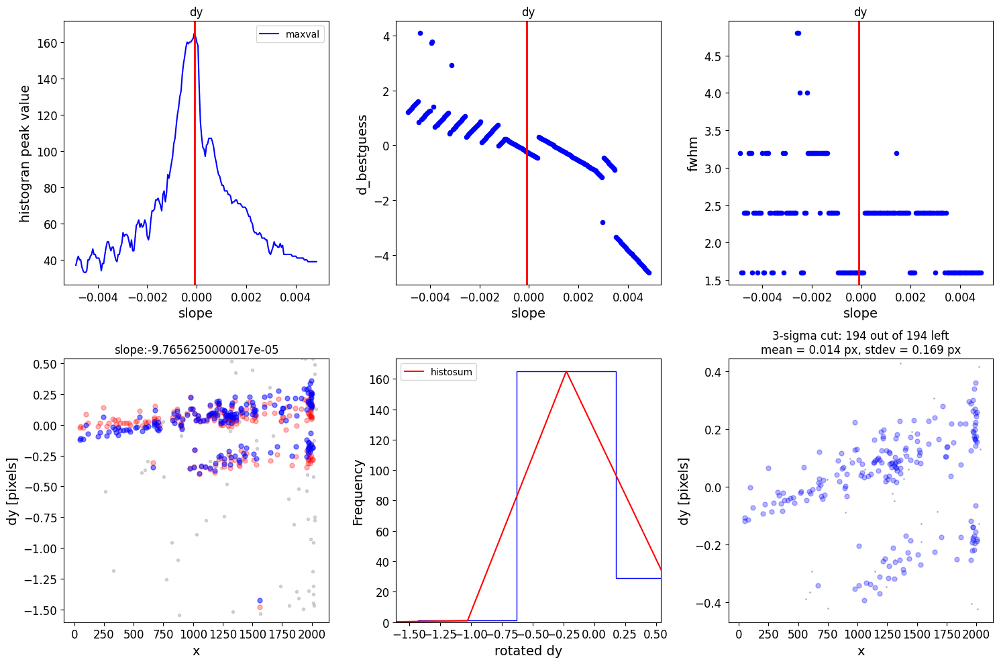

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2024-10-23 21:31:22,131 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.
2024-10-23 21:31:22,315 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(2048, 2048) from jw01334001001_02101_00004_nrcalong_cal.fits>],).
2024-10-23 21:31:22,316 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_dolphot/jhat/jw01334001001_02101_00004_nrcalong_jhat.fits
  output_dir: ./jwstred_temp_dolphot/jhat
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: rshift
  nclip: 3


replacing SIP ./jwstred_temp_dolphot/jhat/jw01334001001_02101_00004_nrcalong_jhat.fits


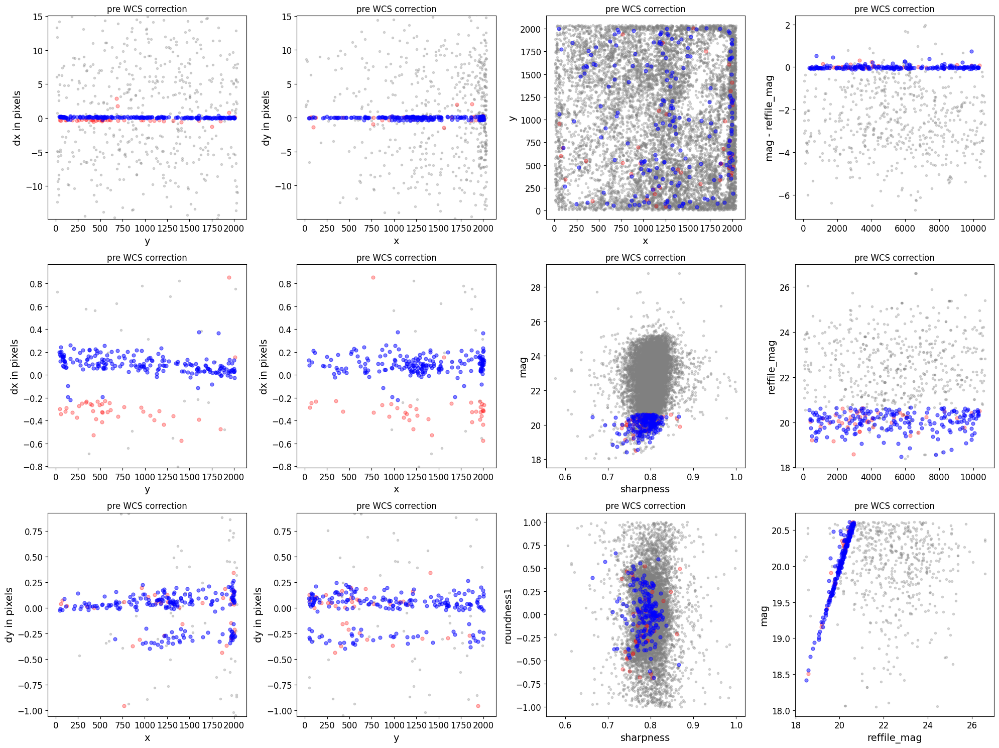

./jwstred_temp_dolphot/jhat/jw01334001001_02101_00004_nrcalong_jhat.fits


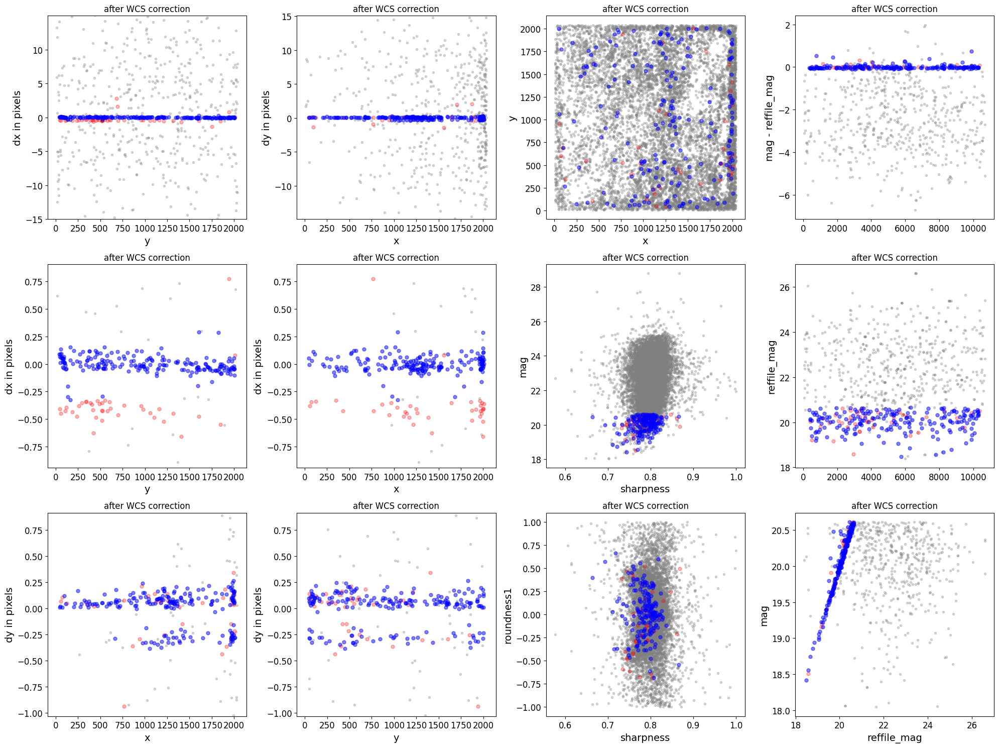

*** Note: close plots to continue!
0 ./jwstred_temp_dolphot/jhat/jw01334001001_02101_00002_nrcalong.phot.txt
Using DQ extension!!


2024-10-23 21:31:26,262 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2024-10-23 21:31:26,335 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2024-10-23 21:31:26,340 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2024-10-23 21:31:26,340 - stpipe - INFO - Instrument: NIRCAM
2024-10-23 21:31:26,340 - stpipe - INFO - Detector: NRCALONG
2024-10-23 21:31:26,341 - stpipe - INFO - Filter: F277W
2024-10-23 21:31:26,341 - stpipe - INFO - Pupil: CLEAR
2024-10-23 21:31:26,341 - stpipe - INFO - Subarray: FULL
2024-10-23 21:31:26,350 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)


dmag 0.2172
dmag 0.1
sharpness 0.9
roundness1 0.7
mag 21
x 2008
y 2008
Saving refcat file into ./jwstred_temp_dolphot/jhat/jw01334001001_02101_00002_nrcalong.refcat.txt
reffile_d2d 0.2
*** Note: close plot to continue!


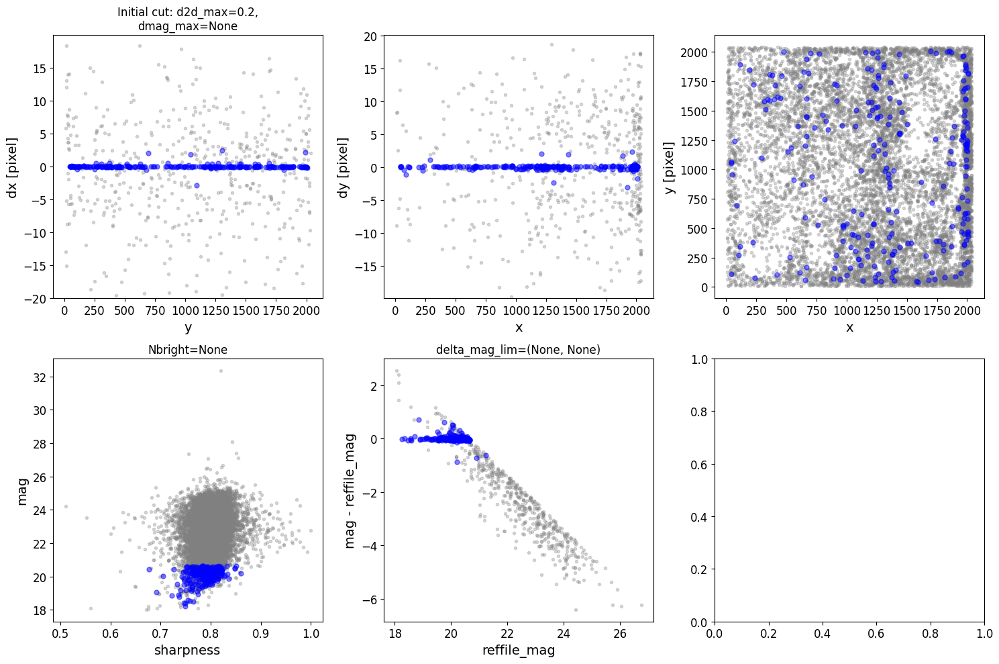

    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000342       0.35   232.0      4    -0.037911   1.6     False
d_rot_tmp 0.7620887081597021
Keeping 245 out of 245, skippin 0 because of null values in columns d_rot_tmp
median: 0.029563
75.000000 percentile cut: max residual for cut: 0.277552
__tmp_residuals 0.27755235024563363
median: 0.070804
i:00 mean:0.070804(0.012913) stdev:0.174207(0.009106) X2norm:1.00 Nchanged:0 Ngood:183 Nclip:62

mean: 0.007033
i:01 mean:0.007033(0.014770) stdev:0.228344(0.010422) X2norm:1.00 Nchanged:57 Ngood:240 Nclip:5

mean: 0.007272
i:02 mean:0.007272(0.015064) stdev:0.233864(0.010630) X2norm:1.00 Nchanged:2 Ngood:242 Nclip:3

mean: 0.007272
i:03 mean:0.007272(0.015064) stdev:0.233864(0.010630) X2norm:1.00 Nchanged:0 Ngood:242 Nclip:3


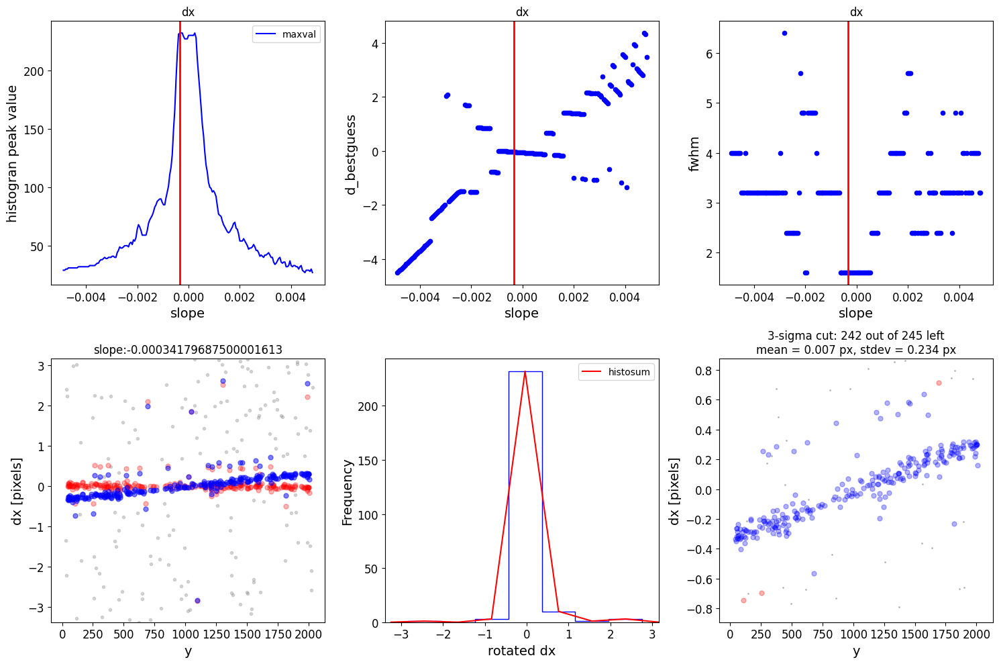

    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000098        0.1   227.0      4    -0.182622   1.6     False
d_rot_tmp 0.6173775217624036
Keeping 238 out of 238, skippin 0 because of null values in columns d_rot_tmp
median: 0.044005
75.000000 percentile cut: max residual for cut: 0.212193
__tmp_residuals 0.21219328998653839
median: 0.082928
i:00 mean:0.082928(0.006385) stdev:0.084942(0.004502) X2norm:1.00 Nchanged:0 Ngood:178 Nclip:60

mean: 0.081219
i:01 mean:0.081219(0.006603) stdev:0.088832(0.004656) X2norm:1.00 Nchanged:4 Ngood:182 Nclip:56

mean: 0.082628
i:02 mean:0.082628(0.006717) stdev:0.090617(0.004737) X2norm:1.00 Nchanged:1 Ngood:183 Nclip:55

mean: 0.082628
i:03 mean:0.082628(0.006717) stdev:0.090617(0.004737) X2norm:1.00 Nchanged:0 Ngood:183 Nclip:55


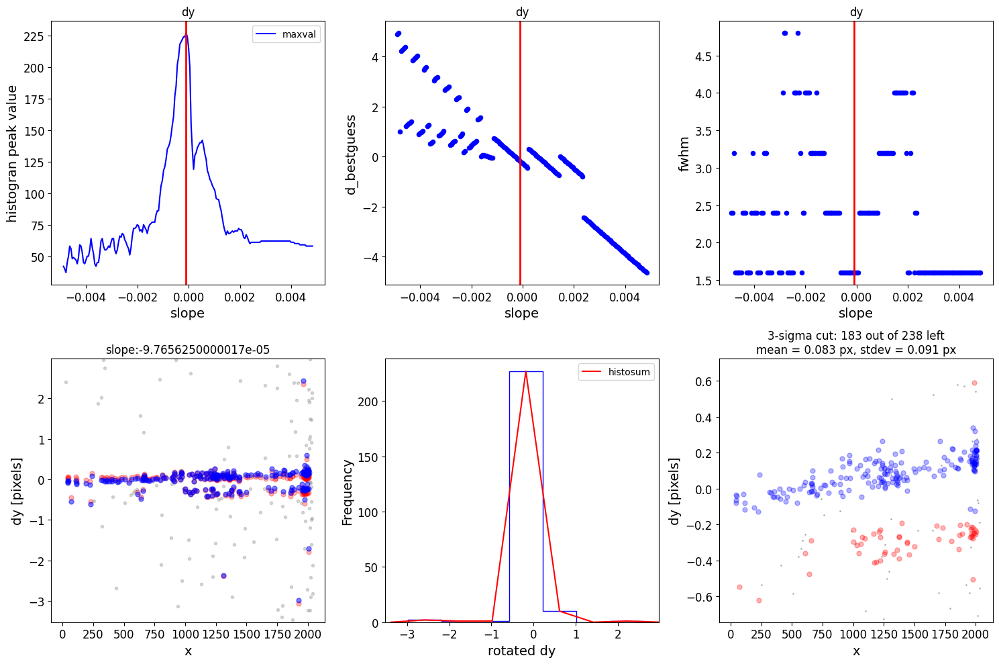

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2024-10-23 21:31:30,886 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.
2024-10-23 21:31:31,074 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(2048, 2048) from jw01334001001_02101_00002_nrcalong_cal.fits>],).
2024-10-23 21:31:31,076 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_dolphot/jhat/jw01334001001_02101_00002_nrcalong_jhat.fits
  output_dir: ./jwstred_temp_dolphot/jhat
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: rshift
  nclip: 3


replacing SIP ./jwstred_temp_dolphot/jhat/jw01334001001_02101_00002_nrcalong_jhat.fits


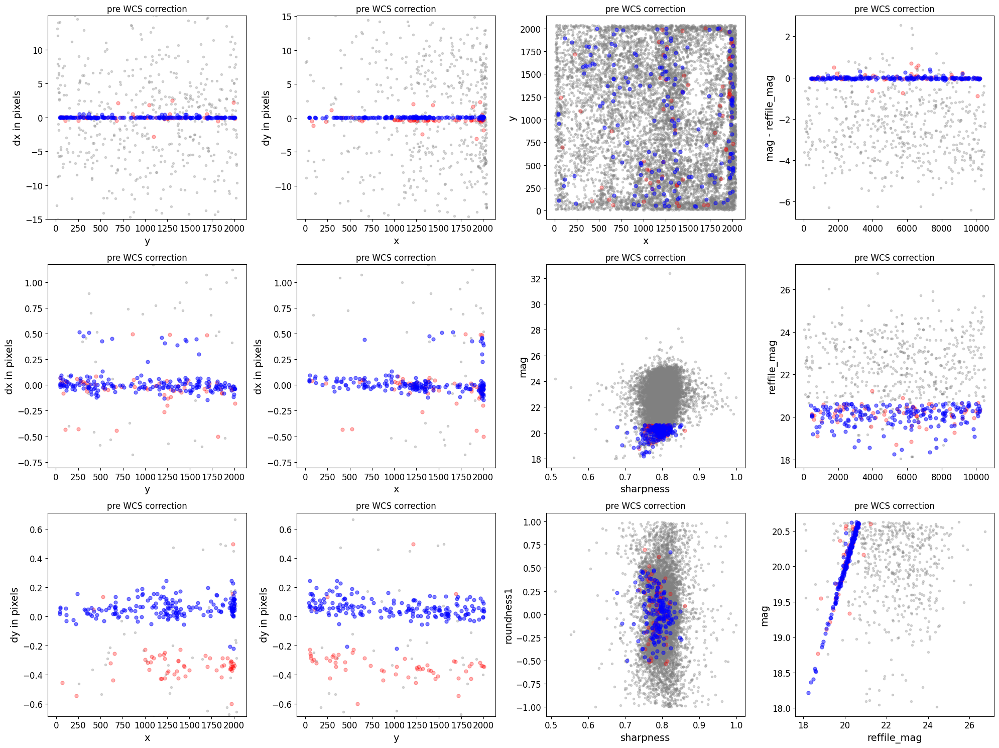

./jwstred_temp_dolphot/jhat/jw01334001001_02101_00002_nrcalong_jhat.fits


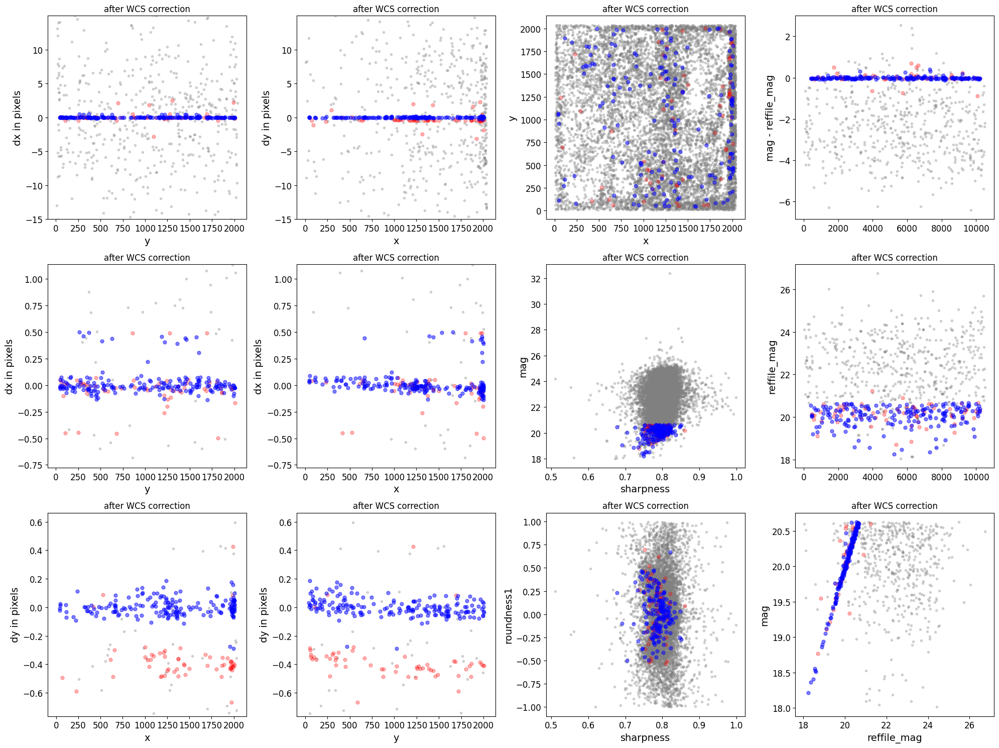

*** Note: close plots to continue!
0 ./jwstred_temp_dolphot/jhat/jw01334001001_02101_00003_nrcalong.phot.txt
Using DQ extension!!


2024-10-23 21:31:34,976 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2024-10-23 21:31:35,050 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2024-10-23 21:31:35,055 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2024-10-23 21:31:35,056 - stpipe - INFO - Instrument: NIRCAM
2024-10-23 21:31:35,056 - stpipe - INFO - Detector: NRCALONG
2024-10-23 21:31:35,056 - stpipe - INFO - Filter: F277W
2024-10-23 21:31:35,056 - stpipe - INFO - Pupil: CLEAR
2024-10-23 21:31:35,056 - stpipe - INFO - Subarray: FULL
2024-10-23 21:31:35,066 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)


dmag 0.2172
dmag 0.1
sharpness 0.9
roundness1 0.7
mag 21
x 2008
y 2008
Saving refcat file into ./jwstred_temp_dolphot/jhat/jw01334001001_02101_00003_nrcalong.refcat.txt
reffile_d2d 0.2
*** Note: close plot to continue!


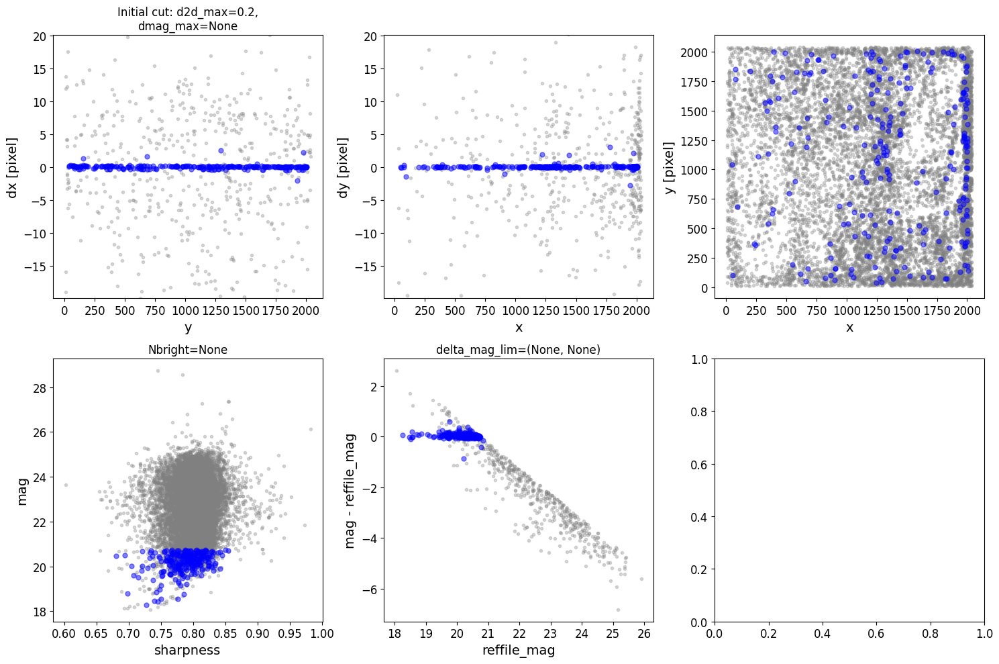

    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000098        0.1   249.0      3     0.004075   1.6     False
d_rot_tmp 0.8040751670626822
Keeping 251 out of 251, skippin 0 because of null values in columns d_rot_tmp
median: 0.097921
75.000000 percentile cut: max residual for cut: 0.107691
__tmp_residuals 0.10769102781342284
median: 0.113851
i:00 mean:0.113851(0.003588) stdev:0.049067(0.002530) X2norm:1.00 Nchanged:0 Ngood:188 Nclip:63

mean: 0.112991
i:01 mean:0.112991(0.003834) stdev:0.053544(0.002704) X2norm:1.00 Nchanged:8 Ngood:196 Nclip:55

mean: 0.114567
i:02 mean:0.114567(0.003956) stdev:0.055521(0.002790) X2norm:1.00 Nchanged:2 Ngood:198 Nclip:53

mean: 0.113733
i:03 mean:0.113733(0.004024) stdev:0.056618(0.002838) X2norm:1.00 Nchanged:1 Ngood:199 Nclip:52

mean: 0.112886
i:04 mean:0.112886(0.004092) stdev:0.057731(0.002887) X2norm:1.00 Nchanged:1 Ngood:200 Nclip:51

mean: 0.112886
i:05 mean:0.112886(0.004092) stdev:0.057731(0.002887) X2norm:1.00 Nchanged:0

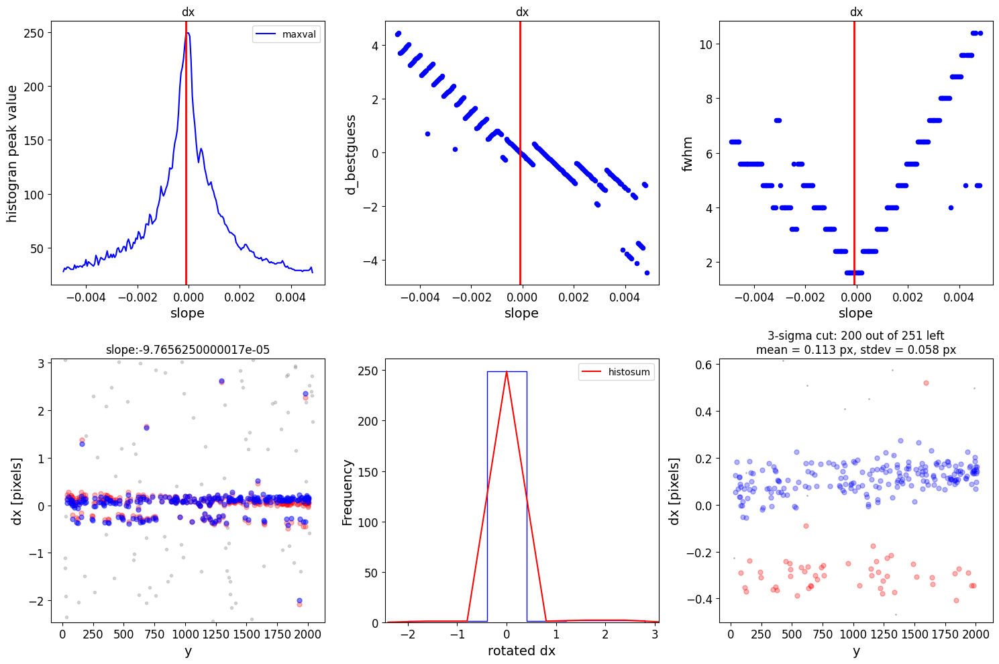

    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000244       0.25   196.0      1      0.06871   1.6     False
d_rot_tmp 0.8687098578995567
Keeping 200 out of 200, skippin 0 because of null values in columns d_rot_tmp
median: 0.120945
75.000000 percentile cut: max residual for cut: 0.201013
__tmp_residuals 0.20101308670097004
median: 0.130498
i:00 mean:0.130498(0.008636) stdev:0.105419(0.006086) X2norm:1.00 Nchanged:0 Ngood:150 Nclip:50

mean: 0.128671
i:01 mean:0.128671(0.010480) stdev:0.141765(0.007390) X2norm:1.00 Nchanged:34 Ngood:184 Nclip:16

mean: 0.109984
i:02 mean:0.109984(0.011508) stdev:0.159875(0.008116) X2norm:1.00 Nchanged:10 Ngood:194 Nclip:6

mean: 0.105548
i:03 mean:0.105548(0.011814) stdev:0.164977(0.008333) X2norm:1.00 Nchanged:2 Ngood:196 Nclip:4

mean: 0.108047
i:04 mean:0.108047(0.012018) stdev:0.168251(0.008476) X2norm:1.00 Nchanged:1 Ngood:197 Nclip:3

mean: 0.108047
i:05 mean:0.108047(0.012018) stdev:0.168251(0.008476) X2norm:1.00 Nchanged:0 

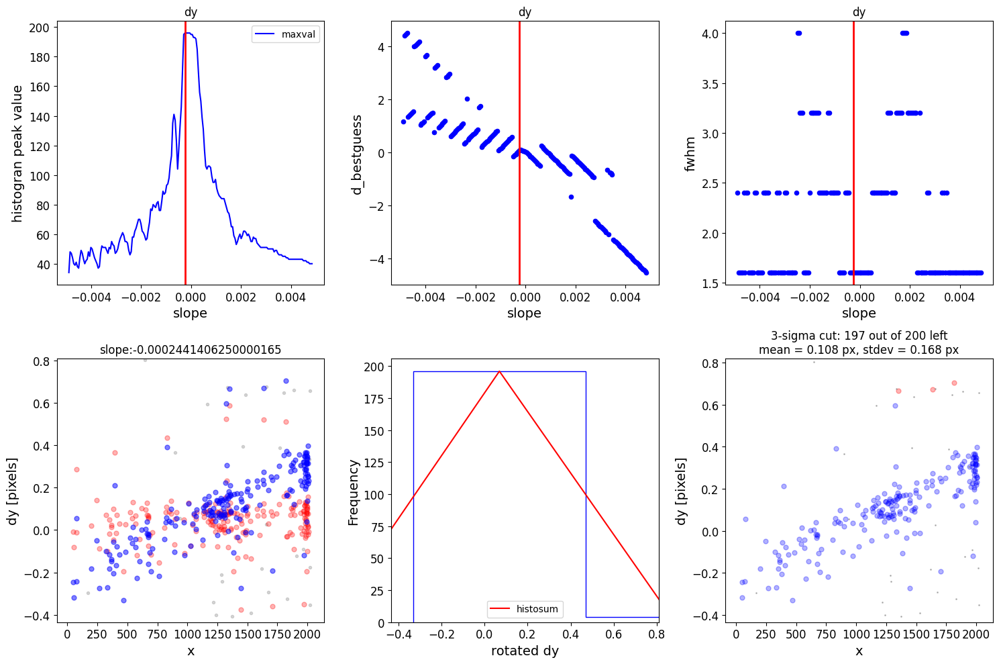

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2024-10-23 21:31:39,595 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.
2024-10-23 21:31:39,788 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(2048, 2048) from jw01334001001_02101_00003_nrcalong_cal.fits>],).
2024-10-23 21:31:39,790 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_dolphot/jhat/jw01334001001_02101_00003_nrcalong_jhat.fits
  output_dir: ./jwstred_temp_dolphot/jhat
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: rshift
  nclip: 3


replacing SIP ./jwstred_temp_dolphot/jhat/jw01334001001_02101_00003_nrcalong_jhat.fits


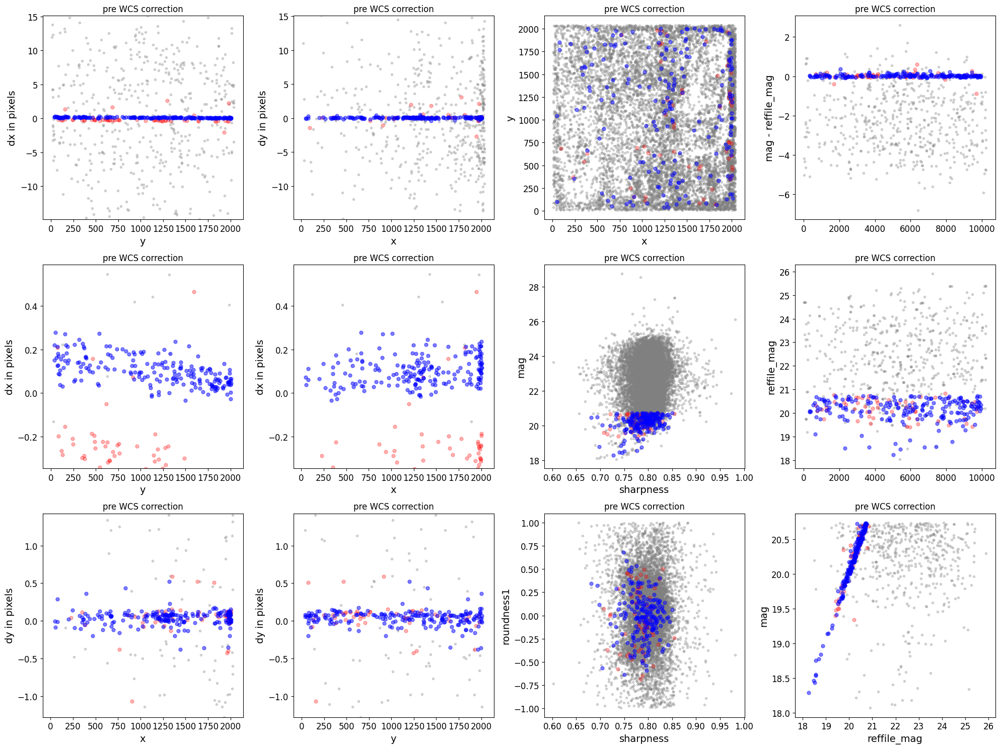

./jwstred_temp_dolphot/jhat/jw01334001001_02101_00003_nrcalong_jhat.fits


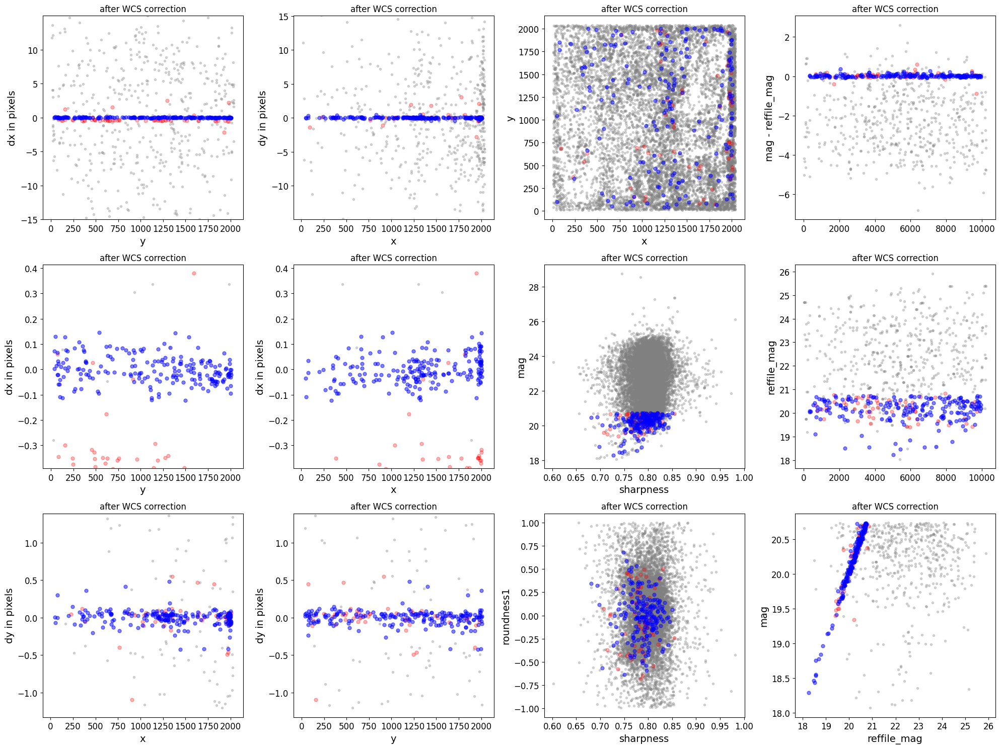

*** Note: close plots to continue!


In [46]:
wcs_align = st_wcs_align()
align_images = glob.glob('jwstred_temp_dolphot/jhat/*long*cal.fits')

for align_im in align_images[1:]:
    wcs_align.run_all(align_im,
                      telescope='jwst',
                      outsubdir='jwstred_temp_dolphot/jhat',
                      refcat_racol='ra',
                      refcat_deccol='dec',
                      refcat_magcol='mag',
                      refcat_magerrcol='dmag',
                      overwrite=True,
                      d2d_max=.2,
                      showplots=2,
                      find_stars_threshold=5,
                      refcatname=ref_catname,
                      histocut_order='dxdy',
                      sharpness_lim=(0.3,0.9),
                      roundness1_lim=(-0.7, 0.7),
                      SNR_min= 5,
                      dmag_max=0.1,
                      Nbright=800,
                      objmag_lim =(14,21),
                      binsize_px = 0.8,
                      use_dq = True)

## Align to Catalog

You can also align each image to the Gaia DR3 catalog, or you
could replace the catalog created in step one with your own
catalog of the field. 



In [3]:
# align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_cal.fits')[0] #short wavelength
# align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')[0] #long wavelength
# align_image = glob.glob('jwstred_temp_gaia/jw01783004005_02101_00001_nrcalong_cal.fits')[0]
align_image = glob.glob('jwstred_temp_gaia/f277w_i2d.fits')[0] #level3 file
# align_image = glob.glob('jwstred_temp_mosaic/jw02784002001_02101_00001_nrcb1_cal.fits')[0]

In [8]:
# to plot regions in ds9
try:
    align_df = pd.read_csv(align_image.replace('.fits', '.phot_psf.txt'), sep = '\s+')
    np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), align_df[['x', 'y']].values, fmt='%s')
except:
    align_df = pd.read_csv(align_image.replace('_cal.fits', '.phot.txt'), sep = '\s+')
    np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), align_df[['x', 'y']].values, fmt='%s')    

In [9]:
_df = pd.read_csv('jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_cal_region.txt', sep = '\s+', header = None)
_df[0], _df[1] = _df[0]+1, _df[1]+1
np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), _df.values, fmt='%s')

telescope set to jwst

### Doing photometry on jwstred_temp_gaia/f277w_i2d.fits
True ./jwstred_temp_gaia/f277w.phot.txt
photometry catalog filename: ./jwstred_temp_gaia/f277w.phot.txt
Instrument: NIRCAM, aperture:NRCA5_FULL
Finding stars --- Detector: NRCALONG, Filter: F277W
FWHM for the filter F277W: 1.444 px
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.11985474824905396 0.12155125964213227


2024-10-24 16:30:44,619 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2024-10-24 16:30:44,755 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2024-10-24 16:30:44,760 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2024-10-24 16:30:44,760 - stpipe - INFO - Instrument: NIRCAM
2024-10-24 16:30:44,761 - stpipe - INFO - Detector: NRCALONG
2024-10-24 16:30:44,761 - stpipe - INFO - Filter: F277W
2024-10-24 16:30:44,761 - stpipe - INFO - Pupil: CLEAR
2024-10-24 16:30:44,761 - stpipe - INFO - Subarray: FULL



Number of sources found in the image: 35501
-------------------------------------

radii:[2.311]pixels radius_sky_in:3.0859999656677246 radius_sky_out:5.238999843597412  radius_for_mag:[2.311]
Performing aperture photometry for radius r = 2.311000108718872 px
Time Elapsed: 5.976058500004001
35283 objects left after removing entries with NaNs in mag or dmag column
dmag 0.2172
SNR_min cut: 35252 objects left after removing entries dmag>0.2172 (SNR<5)
35252 out of 35283 entries remain in photometry table
Saving ./jwstred_temp_gaia/f277w.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 35283 objects
dmag_max =0.1 CUT:
dmag 0.1
35214 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
35201 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
32739 left
objmag_lim=(15, 22) CUT:
mag 22
10691 left
10691 of image photometry objects pass initial cuts #1, 24592 cut
Getting Gaia and matching it: ra=259.2468012911096 dec=43.131668409657934 radius=0.0385965086701874 deg
R

2024-10-24 16:30:58,894 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of stars: 7175
### NO propoer motion correction!!!
Number of stars after removing nan's: 7175
########### !!!!!!!!!!  INITIAL CUT on reference catalog: starting with 7175 objects
7175 of image photometry objects pass initial cuts #1, 0 cut
Matching reference catalog Gaia
Using 10691 image objects that are in x_idl=[-64.21,67.00] and y_idl=[-64.63,66.07] range
x 2046
y 2039
Keeping 2252 out of 7175 catalog objects within x=40.0-2046 and y=40.0-2039
Keeping 2252  after removing NaNs from ra/dec
!! Matching 10691 image objects to 2252 refcat objects!
Saving refcat file into ./jwstred_temp_gaia/f277w.refcat.txt
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 10691 objects
d2d =1.0 CUT using gaia_d2d:
gaia_d2d 1.0
5567 left
5567 of image photometry objects pass initial cuts #1, 5124 cut
dx median: -30.61997336777199
dy median: 5.914781592385623
*** Note: close plot to continue!


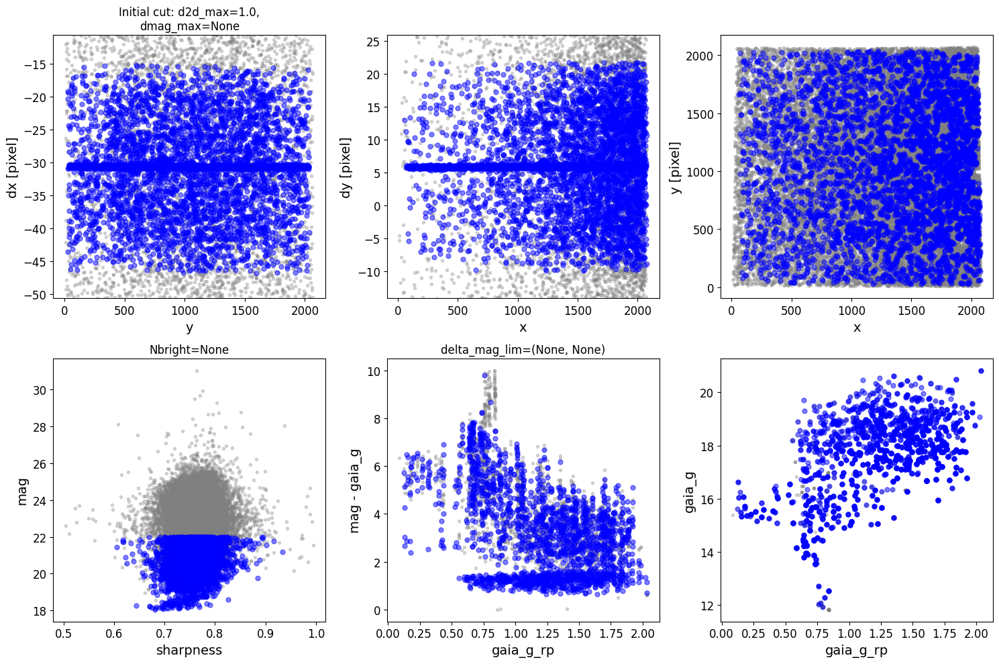

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.000098  -0.101514  2022.0     17   -30.417951   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp -29.61795124009191

rough_cut_px=0.8 pixels removes 3369 from 5567 entries
Keeping 2198 out of 2198, skippin 0 because of null values in columns d_rot_tmp
median: -30.598339
75.000000 percentile cut: max residual for cut: 0.229747
__tmp_residuals 0.2297470054260815
median: -30.598908
i:00 mean:-30.598908(0.002948) stdev:0.119622(0.002084) X2norm:1.00 Nchanged:0 N

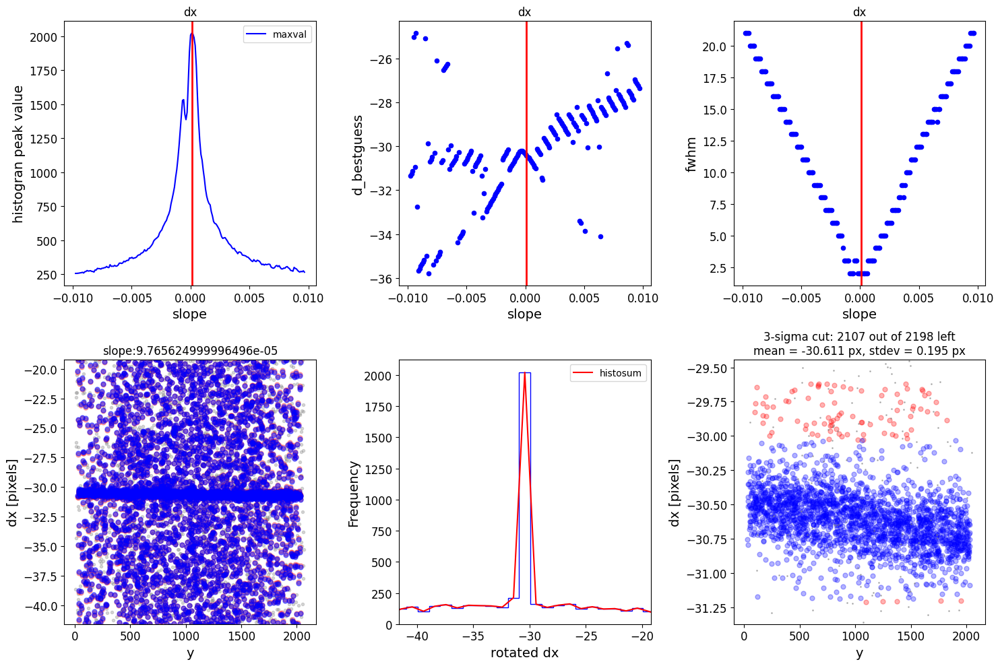

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
        slope    intercept  maxval  index  d_bestguess  fwhm  multimax
-3.469447e-17 3.618633e-14  1732.0     16      5.63783   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 6.437830239314333

rough_cut_px=0.8 pixels removes 223 from 2107 entries
Keeping 1884 out of 1884, skippin 0 because of null values in columns d_rot_tmp
median: 5.899158
75.000000 percentile cut: max residual for cut: 0.189997
__tmp_residuals 0.18999704860813926
median: 5.901132
i:00 mean:5.901132(0.002675) stdev:0.100502(0.001891) X2norm:1.00 Nchan

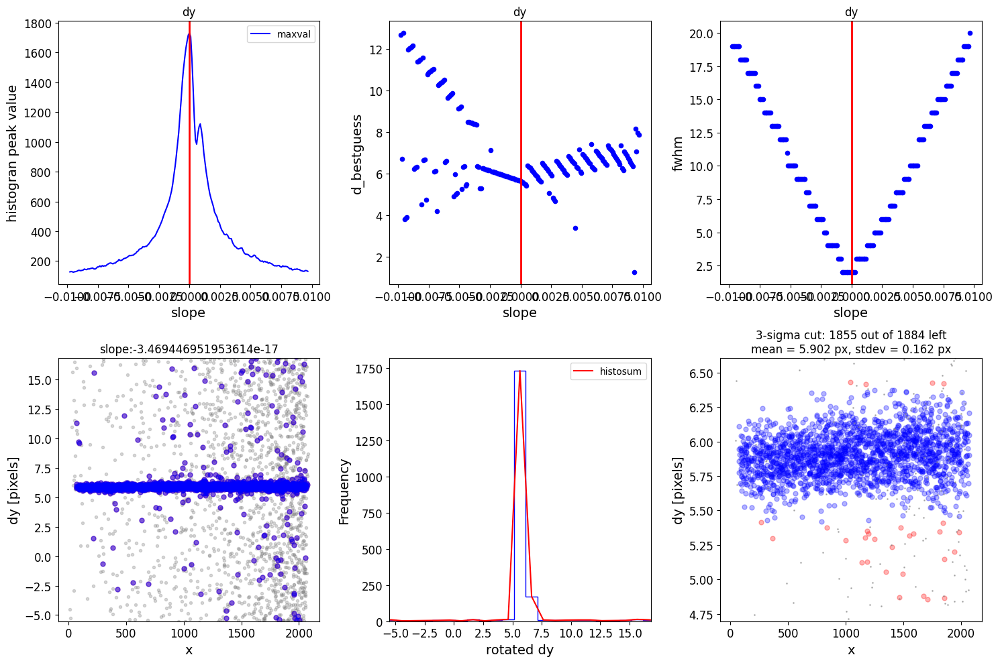

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

dx median of best matched objects of 1st iteration: -30.608091440824268 dy median of best matched objects of 1st iteration: 5.901179971383954
Matching reference catalog Gaia
Using 10691 image objects that are in x_idl=[-64.21,67.00] and y_idl=[-64.63,66.07] range
x 2046
y 2039
Keeping 2252 out of 7175 catalog objects within x=40.0-2046 and y=40.0-2039
Keeping 2252  after removing NaNs from ra/dec
!! Matching 10691 image objects to 2252 refcat objects!
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 10691 objects
d2d =1.0 CUT using gaia_d2d:
gaia_d2d 1.0
5571 left
5571 of image photometry objects pass initial cuts #1, 5120 cut
### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST

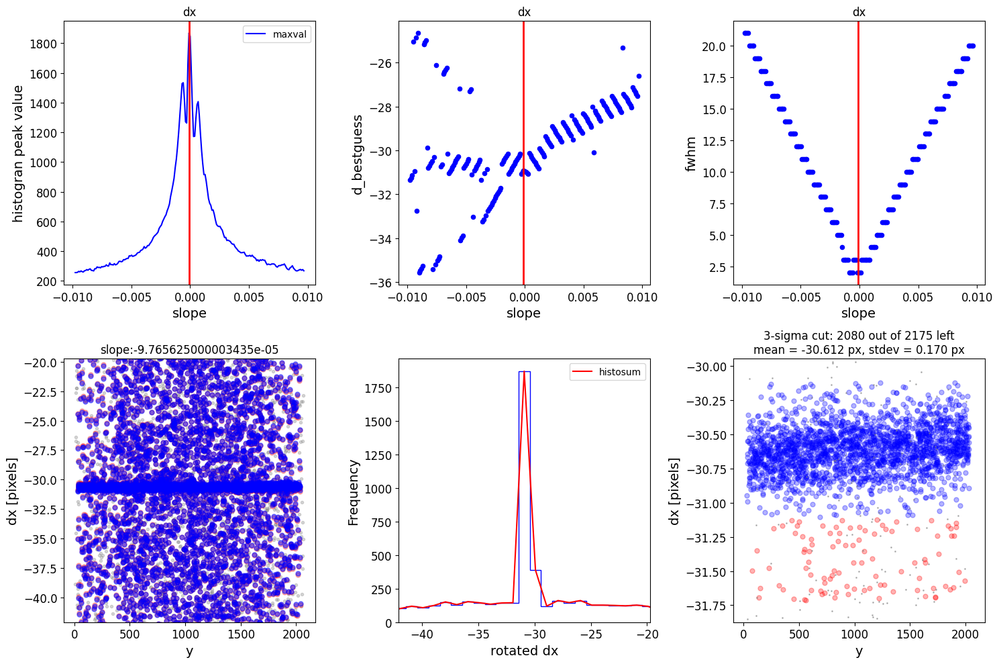

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000195   0.203711  1778.0     16     5.762884   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 6.562883606071062

rough_cut_px=0.8 pixels removes 201 from 2080 entries
Keeping 1879 out of 1879, skippin 0 because of null values in columns d_rot_tmp
median: 5.893666
75.000000 percentile cut: max residual for cut: 0.243527
__tmp_residuals 0.2435274113089516
median: 5.886157
i:00 mean:5.886157(0.003530) stdev:0.132453(0.002495) X2norm:1.00 Nchanged:0 Ngood:1

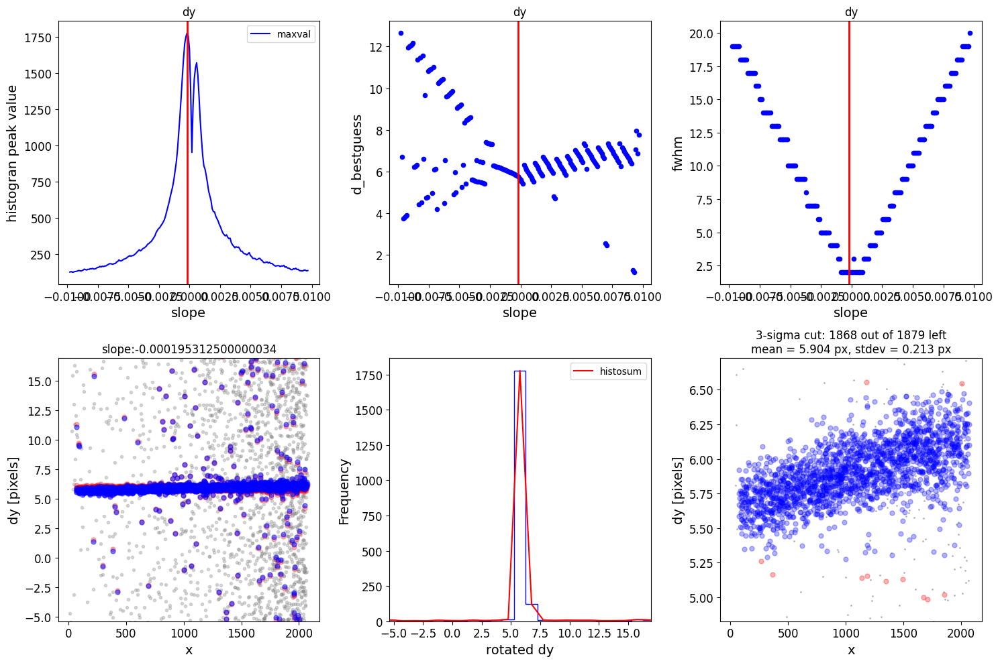

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2024-10-24 16:31:08,927 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.


Setting output directory for f277w_jhat.fits file to ./jwstred_temp_gaia
1868 matches are passed to tweakreg general fitting
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=gaia_ra,gaia_dec


2024-10-24 16:31:09,198 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(2079, 2086) from f277w_i2d.fits>],).
2024-10-24 16:31:09,199 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_gaia/f277w_jhat.fits
  output_dir: ./jwstred_temp_gaia
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  min_gaia: 30
  save_gaia_catalog: False
  telescope: jwst
2024-10-24 16:31:09,204 - stpipe.TweakR

WCSAXES 2 2
CRPIX1 1032.6958639313277 1032.6958639313
CRPIX2 1039.5889844515648 1039.5889844516
PC1_1 0.9843947977415912 0.98440866381391
PC1_2 0.17597409519384305 0.17594011141176
PC2_1 0.17597409519384305 0.17593767074506
PC2_2 -0.9843947977415912 -0.98439793799433
CDELT1 1.74737519505599e-05 1.747375195056e-05
CDELT2 1.74737519505599e-05 1.747375195056e-05
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 259.2465587968547 259.24586215075
CRVAL2 43.13163519481282 43.131439633248
MJD-BEG 59750.96906215162 59750.969062152
MJD-AVG 59750.977947282416 59750.977947282
MJD-END 59750.986832407405 59750.986832407
XPOSURE 1245.464 1245.464
TELAPSE 1245.464 1245.464
OBSGEO-X 358087948.4298654 358087948.42987
OBSGEO-Y -1342867018.7482114 -1342867018.7482
OBSGEO-Z -1031424470.1461744 -1031424470.1462
RADESYS ICRS ICRS
VELOSYS 3874.97 3874.97


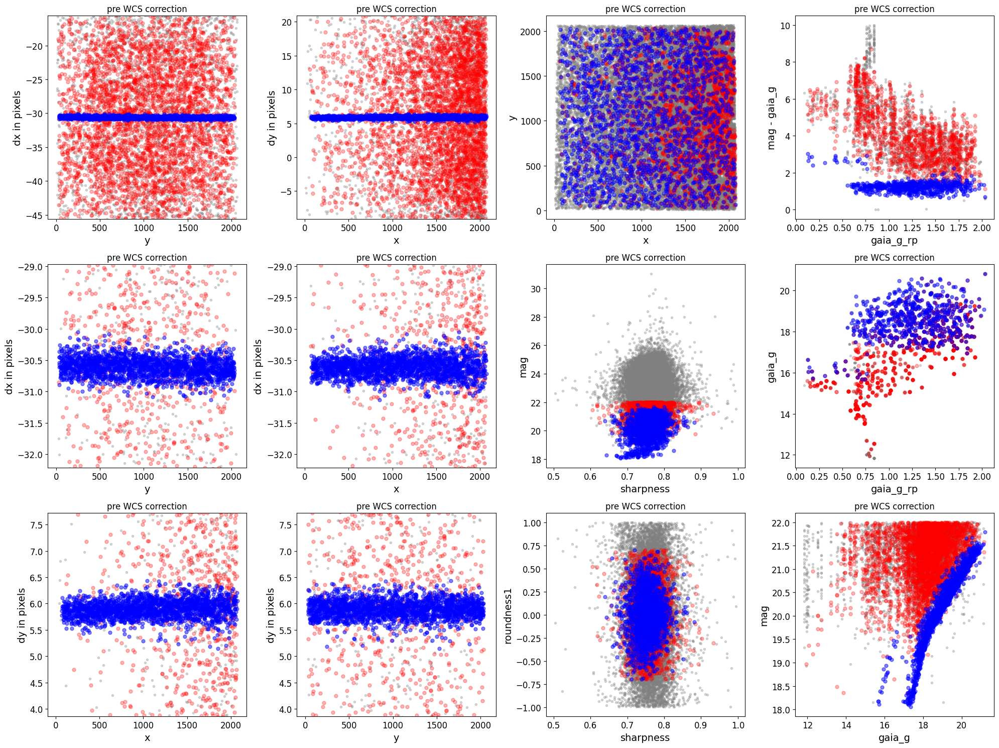

./jwstred_temp_gaia/f277w_jhat.fits
Saving ./jwstred_temp_gaia/f277w_jhat.good.phot.txt
Saving ./jwstred_temp_gaia/f277w_jhat.all.phot.txt


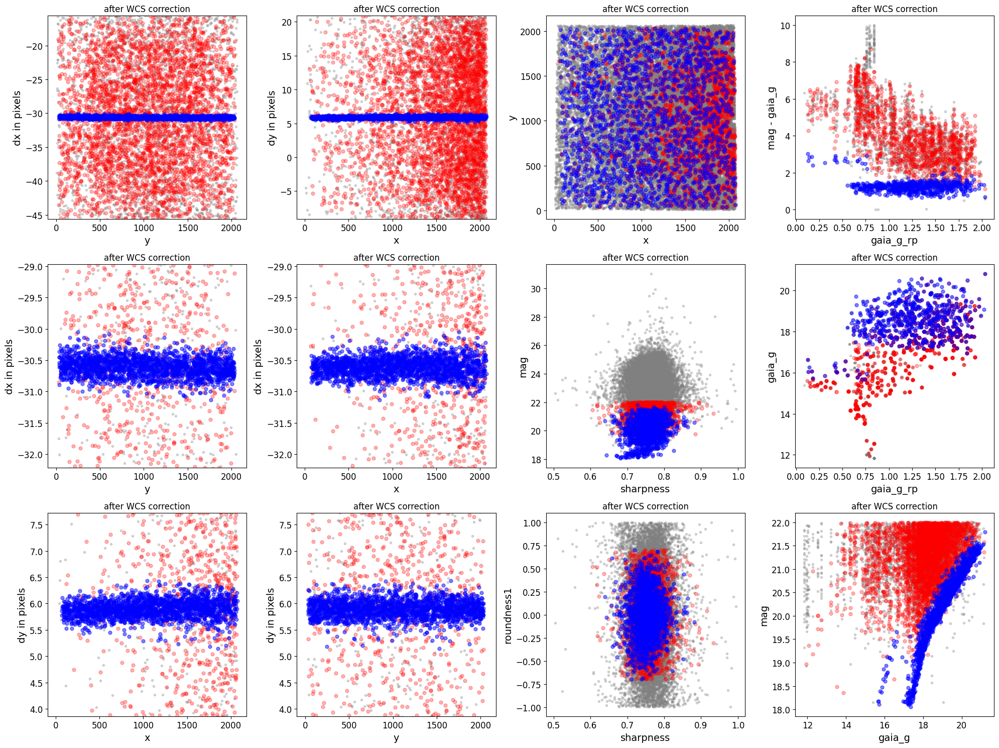

*** Note: close plots to continue!


0

In [74]:
wcs_align = st_wcs_align()
    
wcs_align.run_all(align_image,
          telescope='jwst',
          outsubdir='jwstred_temp_gaia',
          overwrite=True,
          d2d_max=1.0, 
          find_stars_threshold = 3,
          showplots=2,
          refcatname='Gaia',
          refcat_pmflag = True,
          histocut_order='dxdy',
          use_dq = False,
          verbose = True,
          iterate_with_xyshifts = True,
          xshift = -31,
          yshift = 6,
              sharpness_lim=(0.3,0.95),
              roundness1_lim=(-0.7, 0.7),
              # Nbright = 200,
              SNR_min= 5,
              dmag_max=.1,
              objmag_lim =(15,22),
              # refmag_lim = (12,19),
              binsize_px = 1.0,
              saveplots = 0,
              slope_min = -20/2048,
              savephottable = 3)

#### Create ds9 region files

In [38]:
source_df = pd.read_csv('good_sources.csv')
np.savetxt('good_locs.txt', source_df[['x', 'y']].values, fmt = '%s')
np.savetxt('gaia_locs.txt', source_df[['gaia_x', 'gaia_y']].values, fmt = '%s')
np.savetxt('gaiaradec.txt', source_df[['gaia_ra', 'gaia_dec']].values, fmt = '%s')
np.savetxt('jwstradec.txt', source_df[['ra', 'dec']].values, fmt = '%s')

In [39]:
source_df.columns

Index(['aper_sum_4.2px', 'annulus_median_4.2px', 'aper_bkg_4.2px',
       'aper_sum_bkgsub_4.2px', 'flux_err_4.2px', 'mag', 'dmag', 'x', 'y',
       'sharpness', 'roundness1', 'roundness2', 'ra', 'dec', 'x_idl', 'y_idl',
       'gaia_ra', 'gaia_dec', 'gaia_ID', 'gaia_g', 'gaia_g_err', 'gaia_g_rp',
       'gaia_SOURCE_ID', 'gaia_ra_error', 'gaia_dec_error', 'gaia_rp',
       'gaia_rp_err', 'gaia_g_rp_err', 'delta_mag', '__weights', 'd_rot_tmp',
       '__tmp_residuals', 'gaia_x', 'gaia_y', 'dx', 'dy'],
      dtype='object')

Text(0, 0.5, 'gaia mag')

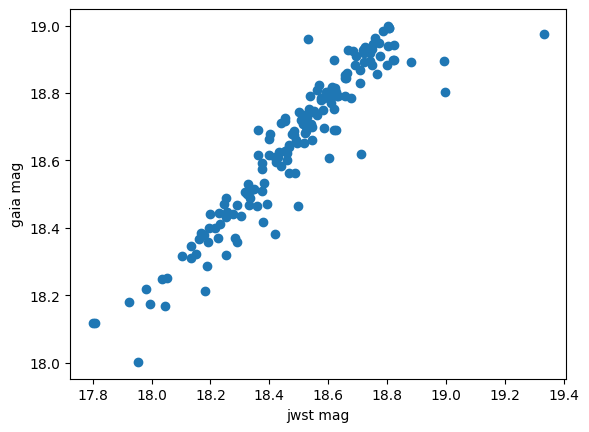

In [40]:
plt.scatter(source_df['mag'], source_df['gaia_g'])
plt.xlabel('jwst mag')
# plt.xlabel('color (jwst - gaia)')
plt.ylabel('gaia mag')
# plt.xlim(16, 25)
# plt.ylim(16,25)

In [23]:
# to plot regions in ds9
try:
    align_df = pd.read_csv(align_image.replace('.fits', '.phot_psf.txt'), sep = '\s+')
    np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), align_df[['x', 'y']].values, fmt='%s')
except:
    align_df = pd.read_csv(align_image.replace('_cal.fits', '.phot.txt'), sep = '\s+')
    np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), align_df[['x', 'y']].values, fmt='%s')    

#### Gaia xmatch

In [5]:
def cut_gaia_sources(image, table_gaia):
    im = fits.open(image)
    hdr = im['SCI'].header
    w = wcs.WCS(hdr)
    nx, ny = hdr['NAXIS1'], hdr['NAXIS2']

    pix_coords = w.all_world2pix(np.array(table_gaia['ra']), np.array(table_gaia['dec']), 1)
    im_x, im_y = pix_coords[0], pix_coords[1]
    mask = (im_x > 0) & (im_x < nx) & (im_y > 0) & (im_y < ny)

    return table_gaia[mask]

In [6]:
def query_gaia(image, dr = 'gaiadr3', save_file = False):
    im = fits.open(image)

    hdr = im['SCI'].header
    nx = hdr['NAXIS1']
    ny = hdr['NAXIS2']

    image_model = ImageModel(im)
    
    #find radius of query region usinng image header
    ra0,dec0 = image_model.meta.wcs(nx/2.0-1,ny/2.0-1)
    coord0 = SkyCoord(ra0,dec0,unit=(u.deg, u.deg), frame='icrs')
    radius_deg = []
    for x in [0,nx-1]:        
        for y in [0,ny-1]:     
            ra,dec = image_model.meta.wcs(x,y)
            radius_deg.append(coord0.separation(SkyCoord(ra,dec,unit=(u.deg, u.deg), frame='icrs')).deg)
    radius_deg = np.amax(radius_deg)*1.1

    #query gaia
    query ="SELECT * FROM {}.gaia_source WHERE CONTAINS(POINT('ICRS',\
            {}.gaia_source.ra,{}.gaia_source.dec),\
            CIRCLE('ICRS',{},{} ,{}))=1;".format(dr,dr,dr,ra0,dec0,radius_deg)

    job5 = Gaia.launch_job_async(query)
    tb_gaia = job5.get_results() 
    tb_gaia = cut_gaia_sources(image, tb_gaia)
    print("Number of Gaia stars:",len(tb_gaia))
    
    if save_file:
        print(f'Saving Gaia query to {save_file}')
        np.savetxt(save_file, np.array(tb_gaia[['ra', 'dec']]), fmt = '%s')
    
    return tb_gaia

In [80]:
def calc_dispersion(gaia_table, phot_file, phot_image = False, dist_limit = 1, plot = False, inspect_large_offset = False):
    jhat_df = pd.read_csv(phot_file, sep = '\s+') #read phot file with uneven spacing

    if phot_image:
        hdr = fits.open(phot_image)['SCI'].header
        w = wcs.WCS(hdr)
        jh_radec = w.all_pix2world(jhat_df['x'], jhat_df['y'], 0)
        jh_ra, jh_dec = np.array(jh_radec[0])*u.degree, np.array(jh_radec[1])*u.degree
        jh_skycoord = SkyCoord(ra = jh_ra, dec = jh_dec)
    else:      
        jh_ra, jh_dec = jhat_df['ra'].to_numpy()*u.degree, jhat_df['dec'].to_numpy()*u.degree
        jh_skycoord = SkyCoord(ra = jh_ra, dec = jh_dec)
    ga_ra, ga_dec = np.array(gaia_table['ra'])*u.degree, np.array(gaia_table['dec'])*u.degree
    ga_skycoord = SkyCoord(ra = ga_ra, dec = ga_dec)
    
    dist_matched_df = xmatch_common(jh_skycoord, ga_skycoord, dist_limit=dist_limit)
    if inspect_large_offset:
        dmask = dist_matched_df['d2d'] > 0.1
        np.savetxt('jwstred_temp_gaia/jwst_large_offset.txt', np.column_stack((np.array(jh_skycoord[dist_matched_df[dmask]['idx_1']].ra.degree),
                       np.array(jh_skycoord[dist_matched_df[dmask]['idx_1']].dec.degree))), fmt='%s', delimiter = ',')
        np.savetxt('jwstred_temp_gaia/gaia_large_offset.txt', np.column_stack((np.array(jh_skycoord[dist_matched_df[dmask]['idx_1']].ra.degree),
                       np.array(ga_skycoord[dist_matched_df[dmask]['idx_2']].dec.degree))), fmt='%s', delimiter = ',')

    clip_mean, clip_median, clip_std = sigma_clipped_stats(dist_matched_df['d2d']**2)
    print(clip_mean, clip_median, clip_std)
    dispersion = np.sqrt(clip_mean)
    
    if plot:
        plt.hist(dist_matched_df['d2d'], bins = 40, histtype = 'step', 
                 linestyle = '--', color = 'cornflowerblue')
        plt.xlabel('d2d (arcsec)')
        plt.ylabel('frequency')
        plt.title('JWST-Gaia xmatch')
        plt.grid(alpha = 0.2, linestyle = '--')
        plt.show()
        
    return dispersion

In [75]:
tb_gaia = query_gaia('jwstred_temp_gaia/f277w_jhat_i2d.fits', save_file = 'all_gaia_locs.txt')

2024-10-24 16:32:14,163 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of Gaia stars: 2773
Saving Gaia query to all_gaia_locs.txt


In [76]:
tb_gaia

solution_id,DESIGNATION,SOURCE_ID,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pm,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_primary_flag,nu_eff_used_in_astrometry,pseudocolour,pseudocolour_error,ra_pseudocolour_corr,dec_pseudocolour_corr,parallax_pseudocolour_corr,pmra_pseudocolour_corr,pmdec_pseudocolour_corr,astrometric_matched_transits,visibility_periods_used,astrometric_sigma5d_max,matched_transits,new_matched_transits,matched_transits_removed,ipd_gof_harmonic_amplitude,ipd_gof_harmonic_phase,ipd_frac_multi_peak,ipd_frac_odd_win,ruwe,scan_direction_strength_k1,scan_direction_strength_k2,scan_direction_strength_k3,scan_direction_strength_k4,scan_direction_mean_k1,scan_direction_mean_k2,scan_direction_mean_k3,scan_direction_mean_k4,duplicated_source,phot_g_n_obs,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_flux_over_error,phot_g_mean_mag,phot_bp_n_obs,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_flux_over_error,phot_bp_mean_mag,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_bp_n_contaminated_transits,phot_bp_n_blended_transits,phot_rp_n_contaminated_transits,phot_rp_n_blended_transits,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_method_used,rv_nb_transits,rv_nb_deblended_transits,rv_visibility_periods_used,rv_expected_sig_to_noise,rv_renormalised_gof,rv_chisq_pvalue,rv_time_duration,rv_amplitude_robust,rv_template_teff,rv_template_logg,rv_template_fe_h,rv_atm_param_origin,vbroad,vbroad_error,vbroad_nb_transits,grvs_mag,grvs_mag_error,grvs_mag_nb_transits,rvs_spec_sig_to_noise,phot_variable_flag,l,b,ecl_lon,ecl_lat,in_qso_candidates,in_galaxy_candidates,non_single_star,has_xp_continuous,has_xp_sampled,has_rvs,has_epoch_photometry,has_epoch_rv,has_mcmc_gspphot,has_mcmc_msc,in_andromeda_survey,classprob_dsc_combmod_quasar,classprob_dsc_combmod_galaxy,classprob_dsc_combmod_star,teff_gspphot,teff_gspphot_lower,teff_gspphot_upper,logg_gspphot,logg_gspphot_lower,logg_gspphot_upper,mh_gspphot,mh_gspphot_lower,mh_gspphot_upper,distance_gspphot,distance_gspphot_lower,distance_gspphot_upper,azero_gspphot,azero_gspphot_lower,azero_gspphot_upper,ag_gspphot,ag_gspphot_lower,ag_gspphot_upper,ebpminrp_gspphot,ebpminrp_gspphot_lower,ebpminrp_gspphot_upper,libname_gspphot
,,,,yr,deg,mas,deg,mas,mas,mas,,mas / yr,mas / yr,mas / yr,mas / yr,mas / yr,,,,,,,,,,,,,,,,,mas,,,,1 / um,1 / um,1 / um,,,,,,,,mas,,,,,deg,,,,,,,,deg,deg,deg,deg,,,electron / s,electron / s,,mag,,electron / s,electron / s,,mag,,electron / s,electron / s,,mag,,,,,,,mag,mag,mag,km / s,km / s,,,,,,,,d,km / s,K,log(cm.s**-2),dex,,km / s,km / s,,mag,mag,,,,deg,deg,deg,deg,,,,,,,,,,,,,,,K,K,K,log(cm.s**-2),log(cm.s**-2),log(cm.s**-2),dex,dex,dex,pc,pc,pc,mag,mag,mag,mag,mag,mag,mag,mag,mag,
int64,object,int64,int64,float64,float64,float32,float64,float32,float64,float32,float32,float32,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,int16,int16,float32,float32,float32,float32,int16,bool,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,float32,int16,int16,int16,float32,float32,int16,int16,float32,float32,float32,float32,float32,float32,float32,float32,float32,bool,int16,float64,float32,float32,float32,int16,float64,float32,float32,float32,int16,float64,float32,float32,float32,float32,int16,int16,int16,int16,int16,float32,float32,float32,float32,float32,int16,int16,int16,int16,float32,float32,float32,float32,float32,float32,float32,float32,

0.0007537884400050523 0.0006402325655584994 0.0005617915644779506


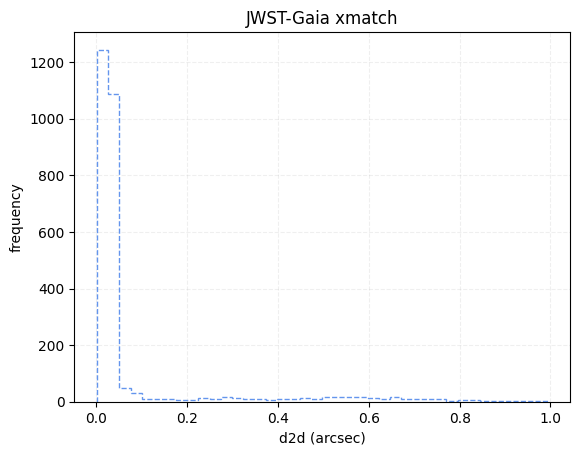

0.027455207884936005

In [81]:
calc_dispersion(tb_gaia, align_image.replace('_i2d.fits', '.phot.txt'), plot = True)

In [78]:
jwst_phot = jwst_photclass()
phot_img = glob.glob('jwstred_temp_gaia/f277w_jhat_i2d.fits')[0]
jwst_phot.run_phot(imagename=phot_img,
                   photfilename='jwstred_temp_gaia/jhat_corr_phot.txt',
                   overwrite=True,
                   ee_radius=70,
#                    use_dq=True,
                   SNR_min = 10,
                   find_stars_threshold = 5)
# ref_catname = ref_image.replace('.fits','.phot.txt') # the default
refcat = Table.read('jwstred_temp_gaia/jhat_corr_phot.txt',format='ascii')
print(refcat)

0 jwstred_temp_gaia/jhat_corr_phot.txt


2024-10-24 16:32:56,618 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2024-10-24 16:32:56,790 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2024-10-24 16:32:56,795 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2024-10-24 16:32:56,795 - stpipe - INFO - Instrument: NIRCAM
2024-10-24 16:32:56,795 - stpipe - INFO - Detector: NRCALONG
2024-10-24 16:32:56,795 - stpipe - INFO - Filter: F277W
2024-10-24 16:32:56,796 - stpipe - INFO - Pupil: CLEAR
2024-10-24 16:32:56,796 - stpipe - INFO - Subarray: FULL


dmag 0.1086
aper_sum_2.3px annulus_median_2.3px aper_bkg_2.3px ...   x_idl     y_idl   
-------------- -------------------- -------------- ... --------- ----------
     17.285761             0.415316        6.96833 ... 43.479657 -64.765938
     28.319523             0.331131       5.555833 ... 45.175068 -64.765808
     12.893281             0.282308       4.736669 ... 52.384012 -64.737681
     44.036851              0.77046      12.927057 ... 58.425765 -64.743491
     12.619148             0.457963       7.683876 ... 61.838519 -64.687523
     90.569462             4.183688      70.195466 ... 20.742178 -64.622353
    111.746543             3.723311        62.4711 ... 22.138594 -64.628996
      7.866155              0.22884       3.839568 ... 25.205835 -64.596996
      23.24973             0.325017        5.45325 ... 32.926848 -64.576308
     27.205379             0.538368       9.032941 ... -1.784244 -64.370921
           ...                  ...            ... ...       ...        ...


0.0002393120656433777 0.00013178602034011666 0.0003679669215754316


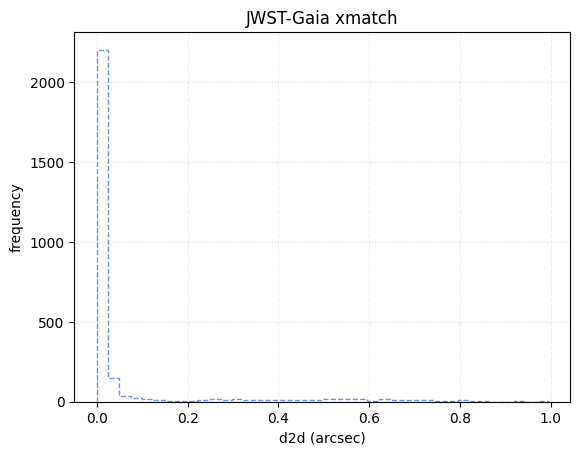

0.015469714465476656

In [82]:
calc_dispersion(tb_gaia, 'jwstred_temp_gaia/jhat_corr_phot.txt', phot_image = 'jwstred_temp_gaia/f277w_jhat_i2d.fits',
                dist_limit = 1.0, plot = True, inspect_large_offset=True)

#### Breakup star mask

In [18]:
jwst_im = fits.open(glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')[0])

In [19]:
jwst_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


In [20]:
dq_mask = deepcopy(jwst_im['DQ'].data)

In [21]:
flag_sat = np.array(dq_mask != 1) & np.array(dq_mask != 2) & np.array(dq_mask != 3)

In [22]:
np.shape(flag_sat), np.shape(dq_mask)

((2048, 2048), (2048, 2048))

In [23]:
flag_sat.sum()

4165548

In [24]:
dq_mask[flag_sat] = 10
dq_mask[~flag_sat] = 1

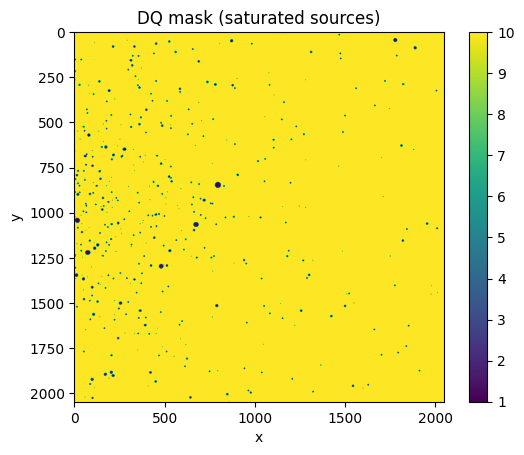

In [26]:
plt.imshow(dq_mask)
plt.colorbar()
plt.xlabel('x')
plt.ylabel('y')
plt.title('DQ mask (saturated sources)')
plt.show()
# plt.savefig('dq_mask.png', bbox_inches = 'tight', dpi = 500)

In [27]:
np.unique(dq_mask)

array([ 1, 10], dtype=uint32)

In [36]:
def expand_mask(mask, size = 40, mask_shape = 'square'):
    """
    Expand the mask by a given size using binary dilation.

    Parameters
    ----------
    mask : numpy.ndarray
        The mask to be expanded.
    size : int
        The size of the structuring element used for binary dilation.
    mask_shape : str
        The shape of the structuring element. Can be 'square' or 'circle'.

    Returns
    -------
    mask_exp : numpy.ndarray
        The expanded mask.
    """
    # Create a binary mask where pixels with flag 1 are set to True
    binary_mask = (mask == 1)
    
    # Define a structuring element
    if mask_shape == 'square':
        structuring_element = np.ones((size, size), dtype=bool)
    if mask_shape == 'circle':
        y, x = np.ogrid[:size, :size]
        center = (size-1)/2
        structuring_element = (x - center)**2 + (y - center)**2 <= center**2
    
    expanded_mask = binary_dilation(binary_mask, structure=structuring_element)
    
    # Convert the expanded binary mask back to the original mask format
    mask_exp = np.where(expanded_mask, 1, mask)
    
    return mask_exp

In [41]:
expmask = expand_mask(dq_mask, mask_shape = 'circle')
expmask[expmask == 1] = False
expmask[expmask == 10] = True
# expmask[expmask == 1] = True

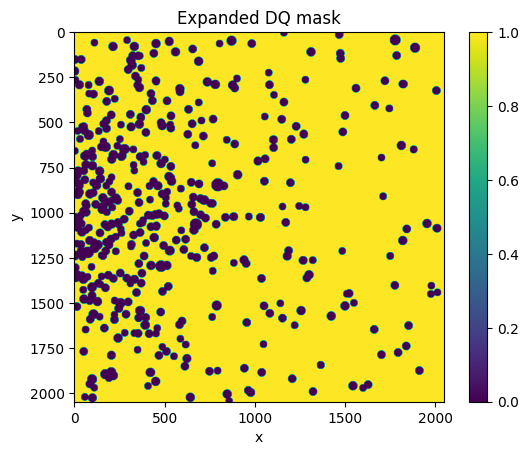

In [42]:
# expmask[expmask > 10] = 10
plt.imshow(expmask)
plt.colorbar()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Expanded DQ mask')
plt.show()
# plt.savefig('exp_dq_mask.png', bbox_inches = 'tight', dpi = 500)

In [43]:
expmask

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint32)

In [17]:
plt.imshow(jwst_im['SCI'].data, vmin = np.nanmedian(jwst_im['SCI'].data) - 1*np.nanstd(jwst_im['SCI'].data),
                                vmax = np.nanmedian(jwst_im['SCI'].data) + 1*np.nanstd(jwst_im['SCI'].data))
plt.colorbar()

In [307]:
# masked_im = np.where(dq_mask, jwst_im['SCI'].data, 3)
masked_im = np.where(expmask, jwst_im['SCI'].data, np.nan)

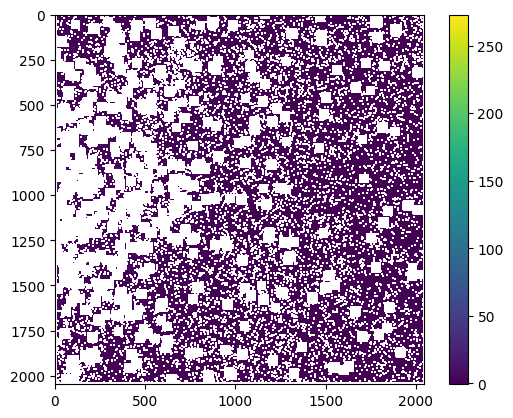

In [308]:
plt.imshow(masked_im)
plt.colorbar()

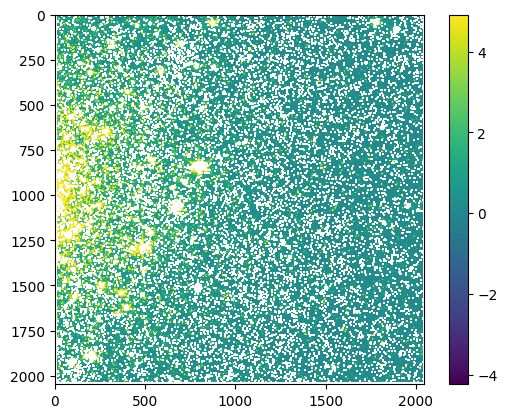

In [38]:
plt.imshow(masked_im, vmin = np.nanmedian(masked_im) - 1*np.nanstd(masked_im),
                      vmax = np.nanmedian(masked_im) + 1*np.nanstd(masked_im))
plt.colorbar()

In [309]:
jwst_im['SCI'].data = masked_im

In [44]:
# bin_dq_hdu = 
data, hdr = fits.getdata('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits', ext=3, header=True)
# bin_dq_data = np.where(expmask, jwst_im['DQ'].data, 3)
hdr['extname'] = 'BIN_DQ'
image_hdu = fits.ImageHDU(data=expmask, name="BIN_DQ", header = hdr)
jwst_im.insert(8, image_hdu)
# bin_dq_hdu

In [45]:
jwst_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   uint32   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  BIN_DQ        1 ImageHDU        11   (2048, 2048)   uint32   
  9  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


In [46]:
jwst_im.writeto('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal_masked.fits', overwrite = True)

In [48]:
def add_bin_dq(filename):
    im = fits.open(filename)
    dq_mask = deepcopy(im['DQ'].data)

    flag_sat = np.array(dq_mask != 1) & np.array(dq_mask != 2) & np.array(dq_mask != 3)
    dq_mask[flag_sat] = 10
    dq_mask[~flag_sat] = 1

    expmask = expand_mask(dq_mask, mask_shape = 'circle')
    expmask[expmask == 10] = False
    expmask[expmask == 1] = True

    data, hdr = fits.getdata(filename, ext=3, header=True)
    hdr['extname'] = 'BIN_DQ'
    image_hdu = fits.ImageHDU(data=expmask, name="BIN_DQ", header = hdr)
    im.insert(8, image_hdu)
    im.writeto(filename.replace('.fits', '_masked.fits'), overwrite = True)


In [49]:
add_bin_dq('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')

In [51]:
im = fits.open('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal_masked.fits')

In [ ]:
def prepare_image(data_original, imhdr, area=None, dq=None, 
                  DNunits=False, dq_ignore_bits = 4):
    # dq_ignore_bits contains the bits in the dq which are still ok, so they
    # should be ignored.
    # 2 = Pixel saturated during integration
    # 4 = Jump detected during integration

    if area is not None:

        if self.verbose: print('Applying Pixel Area Map')

        data_pam = data_original * area

    else:

        data_pam = data_original

    if DNunits:
        if imhdr["BUNIT"]!='MJy/sr':
            raise RuntimeError(f'imhdr["BUNIT"]={imhdr["BUNIT"]} is not MJy/sr!')
        if self.verbose: print(f'Converting units from {imhdr["BUNIT"]} to DN/s')
        data = data_pam / imhdr['PHOTMJSR']
    else:
        data = data_pam


    if dq is not None:
        # dq_ignore_bits are removed from the mask!
        #fits.writeto('TEST_dq_delme.fits',dq,overwrite=True,output_verify='ignore')
        mask = np.bitwise_and(dq,np.full(data_original.shape, ~dq_ignore_bits, dtype='int'))
    else:
        mask = np.zeros(data_original.shape, dtype='int')

    # hijack a few bits for our purposes...
    mask[np.isnan(data)==True] = 8
    mask[np.isfinite(data)==False] = 8
    mask[np.where(data==0)] = 16

    #fits.writeto('TEST_mask_delme.fits',mask,overwrite=True,output_verify='ignore')

    data[mask>0] = np.nan

    return data,mask,DNunits

In [19]:
test_im = fits.open('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')

In [20]:
test_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  BIN_DQ        1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  9  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


In [23]:
data_original, imhdr = test_im['SCI'].data, test_im['SCI'].header
area = test_im['AREA'].data
dq = test_im['BIN_DQ'].data
dq_ignore_bits = 4
DNunits = False

if area is not None:

#     if self.verbose: print('Applying Pixel Area Map')

    data_pam = data_original * area

else:

    data_pam = data_original

if DNunits:
    if imhdr["BUNIT"]!='MJy/sr':
        print('no')
#         raise RuntimeError(f'imhdr["BUNIT"]={imhdr["BUNIT"]} is not MJy/sr!')
#     if self.verbose: print(f'Converting units from {imhdr["BUNIT"]} to DN/s')
    data = data_pam / imhdr['PHOTMJSR']
else:
    data = data_pam


if dq is not None:
    # dq_ignore_bits are removed from the mask!
    #fits.writeto('TEST_dq_delme.fits',dq,overwrite=True,output_verify='ignore')
    mask = np.bitwise_and(dq,np.full(data_original.shape, ~dq_ignore_bits, dtype='int'))
else:
    mask = np.zeros(data_original.shape, dtype='int')

# hijack a few bits for our purposes...
mask[np.isnan(data)==True] = 8
mask[np.isfinite(data)==False] = 8
mask[np.where(data==0)] = 16

#fits.writeto('TEST_mask_delme.fits',mask,overwrite=True,output_verify='ignore')

data[mask>0] = np.nan

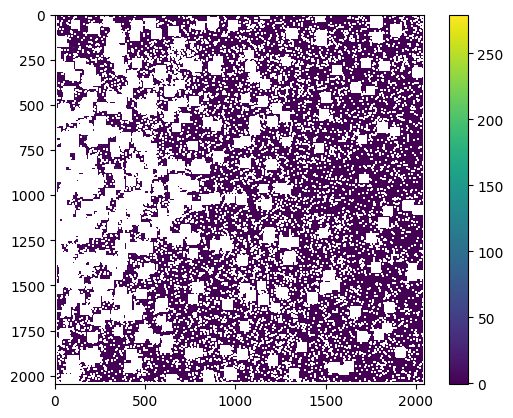

In [24]:
plt.imshow(data)
plt.colorbar()

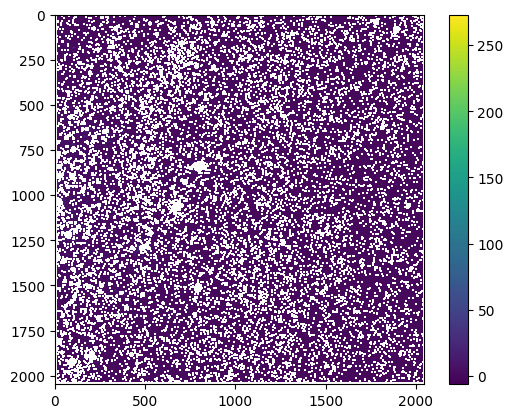

In [15]:
plt.imshow(test_im['SCI'].data)
plt.colorbar()

In [275]:
dq = test_im['BIN_DQ'].data
og_data = np.array(test_im['SCI'].data)
dq_ignore_bits = 4
mask = np.bitwise_and(dq, np.full(og_data.shape, ~dq_ignore_bits, dtype = 'int'))

In [247]:
dq

array([[2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       ...,
       [2155347969, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665]], dtype=uint32)

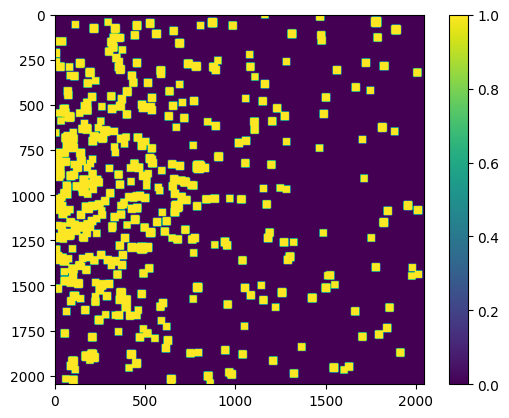

In [276]:
# mask = np.array(mask, dtype = 'float32')
# mask[mask>0] = np.nan
plt.imshow(mask)
plt.colorbar()

In [148]:
np.bitwise_and(np.array([1]), np.array([5]))

array([1])

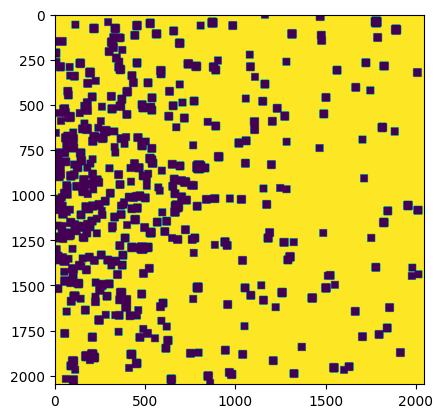

In [142]:
plt.imshow(dq)